In [ ]:
import os
import json
import pandas as pd
from glob import glob
from sklearn.model_selection import train_test_split
from PIL import Image
from tqdm import tqdm
import yaml
import matplotlib.pyplot as plt
import cv2

In [ ]:
# 데이터 셋 다운로드
!git clone https://github.com/ndb796/YOLO-Datasets

Cloning into 'YOLO-Datasets'...
remote: Enumerating objects: 7606, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 7606 (delta 1), reused 8 (delta 1), pack-reused 7598
Receiving objects: 100% (7606/7606), 115.67 MiB | 22.89 MiB/s, done.
Resolving deltas: 100% (5/5), done.


In [ ]:
#경로확인
!pwd

/content


In [ ]:
# data.yaml 수정 확인

!cat /content/YOLO-Datasets/mask_wearing_dataset/data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['mask', 'no-mask']

In [ ]:
#data.yaml 파일을 읽어 환경 설정 내용 불러오기

with open('/content/YOLO-Datasets/mask_wearing_dataset/data.yaml') as f:
  conf = yaml.load(f,Loader=yaml.FullLoader)

number_of_class=conf['nc']
class_names=conf['names']

In [ ]:
number_of_class

2

In [ ]:
class_names

['mask', 'no-mask']

In [ ]:
# mask, no-mask 이외에는 background로 분류됨

In [ ]:
conf

{'train': '../train/images',
 'val': '../valid/images',
 'nc': 2,
 'names': ['mask', 'no-mask']}

In [ ]:
train_path='/content/YOLO-Datasets/mask_wearing_dataset/train'
valid_path='/content/YOLO-Datasets/mask_wearing_dataset/valid'
test_path='/content/YOLO-Datasets/mask_wearing_dataset/test'

train_count=os.listdir(train_path+'/images/')
valid_count=os.listdir(valid_path+'/images/')
test_count=os.listdir(test_path+'/images/')

print(f'학습용:{len(train_count)}')
print(f'검증용:{len(valid_count)}')
print(f'테스트용:{len(test_count)}')

학습용:104
검증용:28
테스트용:15


In [ ]:
plt.rcParams['figure.figsize']=[12,8]
plt.rcParams['figure.dpi']=80

In [ ]:
# 이미지 화면에서 출력해보기

In [ ]:
image_name='0200b38c89b16c37c5de8e247bb00c2f_jpg.rf.6a5b142fd82320d571402836bce2cf0a.jpg'

In [ ]:
image_name

'0200b38c89b16c37c5de8e247bb00c2f_jpg.rf.6a5b142fd82320d571402836bce2cf0a.jpg'

In [ ]:
img=cv2.imread(train_path+'/'+'images/'+image_name)
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB) #conver Color 이미지를 BGR에서 RGB로 변환
print(f'이미지 해상도: {img.shape}')

이미지 해상도: (416, 416, 3)


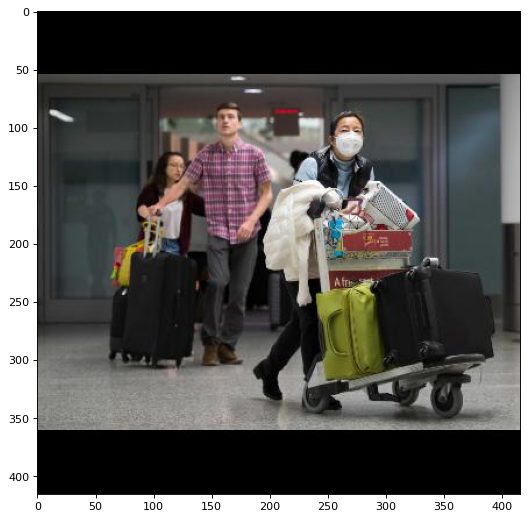

In [ ]:
plt.imshow(img)
plt.show()

In [ ]:
# 바운딩박스와 함께 추출

In [ ]:
# 레이블 파일 확인

In [ ]:
label_name='0200b38c89b16c37c5de8e247bb00c2f_jpg.rf.6a5b142fd82320d571402836bce2cf0a.txt'

클래스:0, 중심좌표:(0.63702,0.254808), 너비:0.09135, 높이: 0.11058
클래스:1, 중심좌표:(0.27644,0.317308), 너비:0.06250, 높이: 0.07212
클래스:1, 중심좌표:(0.39423,0.221154), 너비:0.06731, 높이: 0.08173


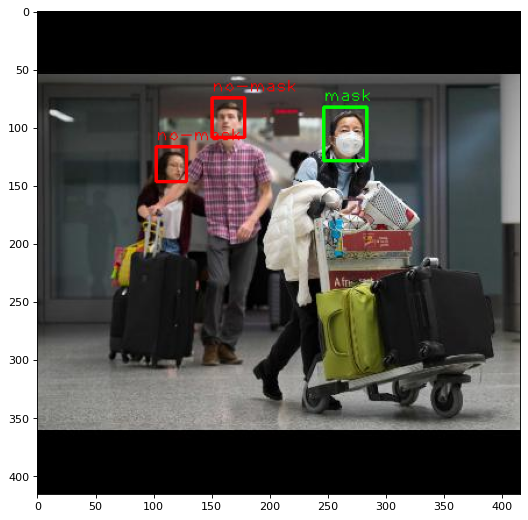

In [ ]:
with open(train_path+'/labels/'+label_name) as f:
  for instance in f.readlines():
    image_width, image_height= 416,416

    label, x,y,width,height=map(float,instance.strip().split())
    print(f'클래스:{int(label)}, 중심좌표:({x:.5f},{y:5f}), 너비:{width:.5f}, 높이: {height:.5f}')

    if int(label)==0:
      c=(0,255,0)
    elif int(label)==1:
      c=(255,0,0)

    # 왼쪽 위 좌표와 오른쪽 아래 좌표
    x1, y1 = image_width *(x-width/2), image_height*(y-height/2)
    x2, y2 = image_width *(x+width/2), image_height*(y+height/2)

    # 사각형 그리기
    cv2.rectangle(
        img,
        (int(x1),int(y1)),
        (int(x2),int(y2)),
        color=c,
        thickness=2,
    )

    #텍스트 그리기
    cv2.putText(
        img,
        class_names[int(label)],#name
        (int(x1), int(y1)-5), #위치
        fontFace=cv2.FONT_HERSHEY_PLAIN,
        fontScale=1.0, #글씨크기
        color=c,
        thickness=1
    )

plt.imshow(img)
plt.show()


In [ ]:
#####

In [ ]:
#YOLO 구현

In [ ]:
!pwd

/content


# YOLO v5로 진행

Pytorch 기반 코드로 수행

YOLO v5 Samll

YOLO v5m Medium

YOLO v5l Large

YOLO v5x XLarge

In [ ]:
%cd /content/

/content


In [ ]:
!pwd

/content/yolov5


In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 14654, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 14654 (delta 0), reused 3 (delta 0), pack-reused 14650
Receiving objects: 100% (14654/14654), 13.79 MiB | 27.96 MiB/s, done.
Resolving deltas: 100% (10086/10086), done.


In [ ]:
%cd /content/yolov5/

/content/yolov5


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 18.5 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
     |████████████████████████████████| 1.6 MB 72.1 MB/s 


In [ ]:
# 샘플 분석 진행
#실제 테스트 데이터로 디텍팅할때 사용
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source ./data/images/

detect: weights=['yolov5s.pt'], source=./data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-40-gb2a0f1c Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 14.1M/14.1M [00:00<00:00, 52.4MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 17.0ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 14.2ms
Speed: 0.5ms pre-process, 15.6ms inference, 19.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
from IPython.display import Image as Display

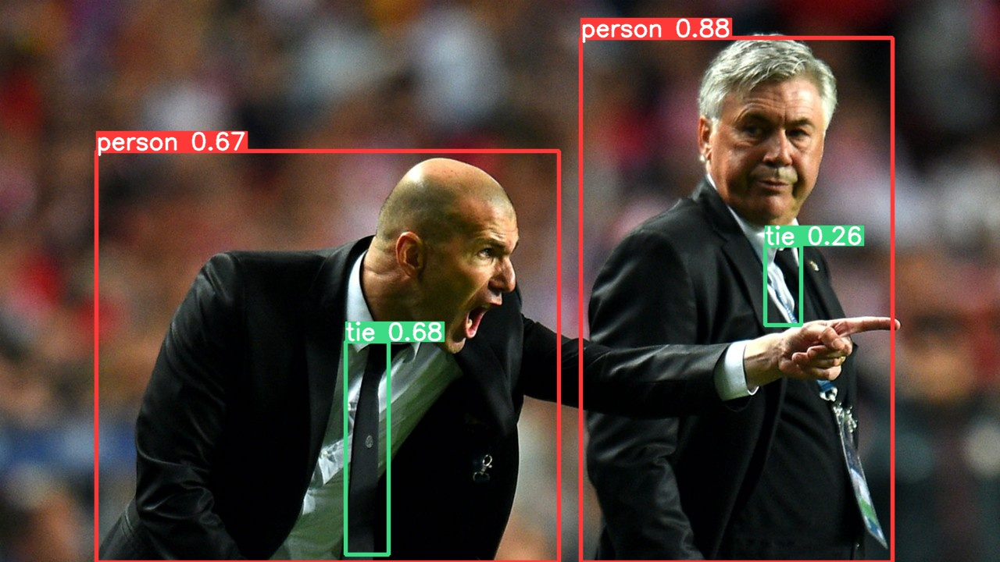

In [ ]:
Display(filename='runs/detect/exp/zidane.jpg')

In [ ]:
!pwd

/content/yolov5


# 학습된 모델 사용해보기

In [ ]:
!python train.py --img 416 --epochs 50 --batch 32 --data /content/YOLO-Datasets/mask_wearing_dataset/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name mask_wearing_yolov5

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/YOLO-Datasets/mask_wearing_dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=mask_wearing_yolov5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-40-gb2a0f1c Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1

In [ ]:
!pwd

/content/yolov5


In [ ]:
##### result png를 확인하여 전체 학습결과 분석
!ls runs/train/mask_wearing_yolov52

confusion_matrix.png				   R_curve.png
events.out.tfevents.1671428890.7b09d988df8c.590.0  results.csv
F1_curve.png					   results.png
hyp.yaml					   train_batch0.jpg
labels_correlogram.jpg				   train_batch1.jpg
labels.jpg					   train_batch2.jpg
opt.yaml					   val_batch0_labels.jpg
P_curve.png					   val_batch0_pred.jpg
PR_curve.png					   weights


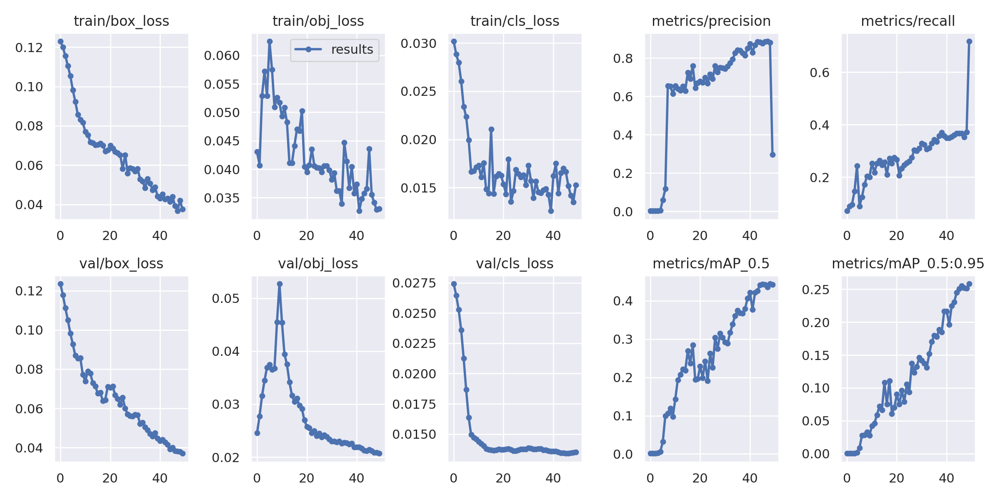

In [ ]:
Display(filename='runs/train/mask_wearing_yolov52/results.png',width=1000)

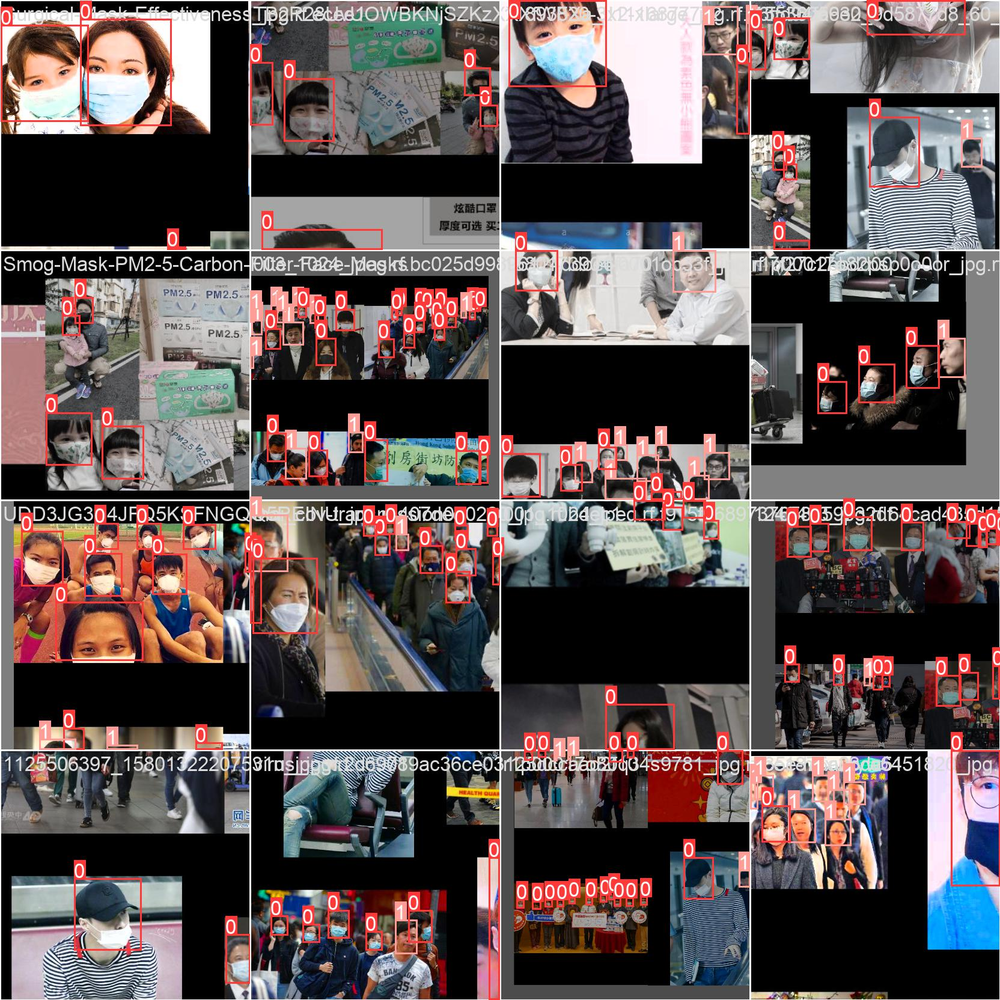

In [ ]:
Display(filename='runs/train/mask_wearing_yolov52/train_batch0.jpg',width=1000)

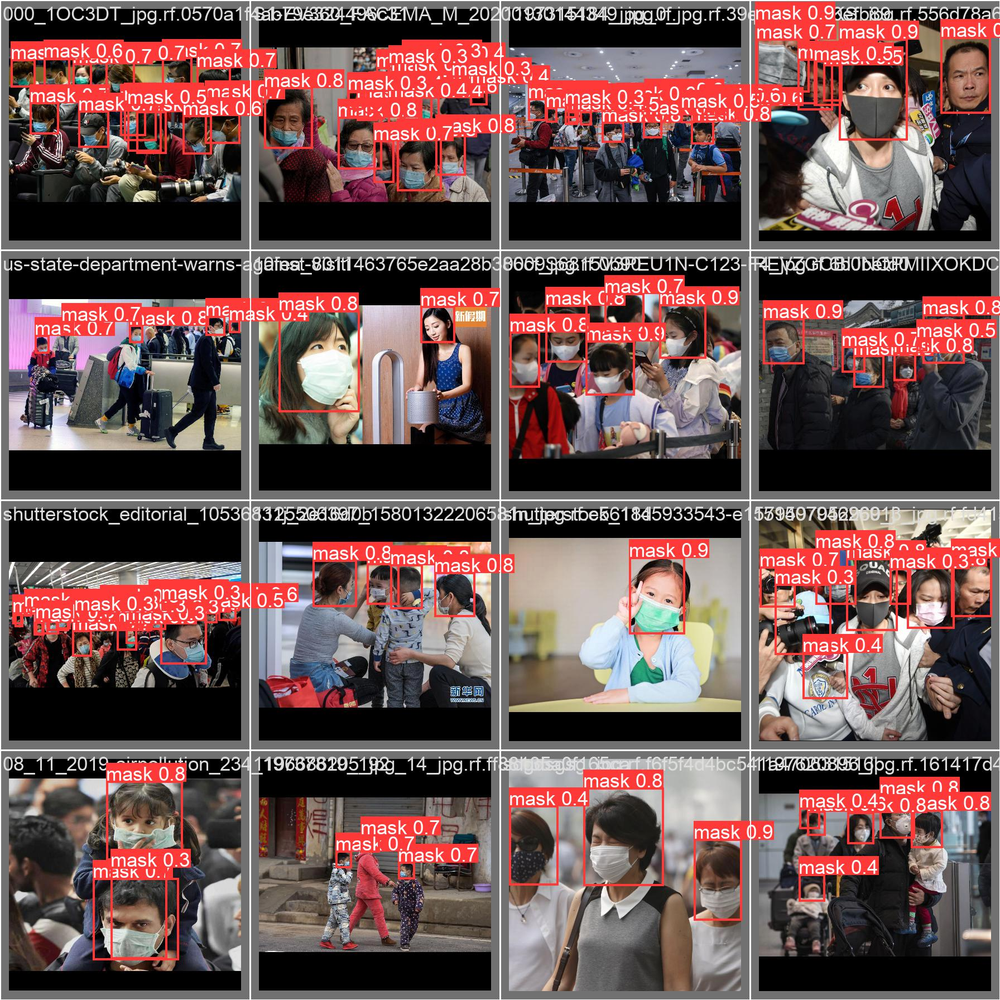

In [ ]:
# Test data 출력

Display(filename='runs/train/mask_wearing_yolov52/val_batch0_pred.jpg',width=1000)

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.45 --source /content/yolov5/data/images/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.45, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='/content/yolov5/data/images/', update=False, view_img=False, weights=['yolov5s.pt'])
YOLOv5 🚀 v3.1-446-gcd9aa38 torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Traceback (most recent call last):
  File "detect.py", line 184, in <module>
    detect(opt=opt)
  File "detect.py", line 33, in detect
    model = attempt_load(weights, map_location=device)  # load FP32 model
  File "/content/yolov5/models/experimental.py", line 120, in attempt_load
    ckpt = torch.load(w, map_location=map_location)  # load
  File "/usr/local/lib/python3.8/dist-packages/torch/serialization.py", line 789, in load
    return _load(opened_zipfile, map_location, pickle_module, **pickle_load_args)
  File "/usr/

In [ ]:
!pwd

/content


In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 14513, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 14513 (delta 19), reused 24 (delta 14), pack-reused 14477
Receiving objects: 100% (14513/14513), 13.60 MiB | 15.81 MiB/s, done.
Resolving deltas: 100% (9998/9998), done.


In [ ]:
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 29.2 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 1.6 MB 56.1 MB/s 


In [ ]:
%reload_ext tensorboard
%load_ext tensorboard
%tensorboard --logdir ./runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!python val.py --data /content/YOLO-Datasets/mask_wearing_dataset/data.yaml --img 416 --weight runs/train/mask_wearing_yolov52/weights/best.pt

val: data=/content/YOLO-Datasets/mask_wearing_dataset/data.yaml, weights=['runs/train/mask_wearing_yolov52/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-40-gb2a0f1c Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/YOLO-Datasets/mask_wearing_dataset/valid/labels.cache... 28 images, 0 backgrounds, 0 corrupt: 100% 28/28 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:00<00:00,  1.33it/s]
                   all         28        160      0.298      0.718      0.443      0.259
                  mask         28        140      0